In [7]:
import clip
import torch
import torchvision

#print(clip.available_models())
model, preprocess = clip.load('ViT-B/32', jit=False, device="cuda:0") #0 is the index of the location in the GPU

from PIL import Image
import requests
from io import BytesIO

def img2vec(img_path, type):
    #print(img_path)
    try:
        if type == 'path':
            #we input the path to the image
            image = Image.open(img_path)
        elif type == 'image':
            #we input a pre-loaded image
            image = img_path
        elif type == 'url':
            #we input an url
            image = Image.open(BytesIO(requests.get(img_path, timeout=15).content))
        #display(image)

        # pre-process image
        image = preprocess(image).unsqueeze(0)
        with torch.no_grad(): #we prevent data to be cached in the GPU, which eventually results in error
            vector = model.encode_image(image.cuda())
        return vector.tolist()[0]
    except:
        return 0
#by using tensor.cuda() (in this case Image, which we previously converted into a Tensor), we are placing the image to be processed into the gpu

def img_resize(img, x):
    #mantains the aspect ratio
    return img.resize((x, int((x/img.size[0])*img.size[1])))

In [20]:
#create folder with resized images
import os

for img in os.listdir('image'):
    img_resize(Image.open('image/'+img), 150).save('image_resized/'+img)

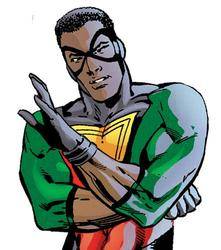

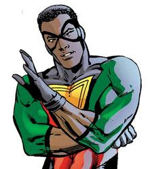

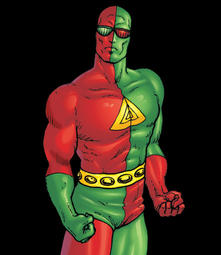

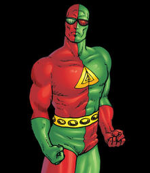

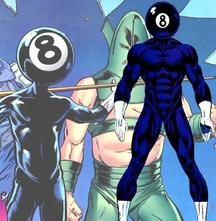

...

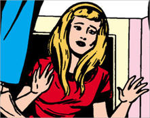

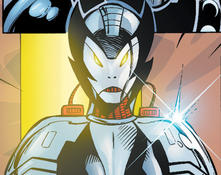

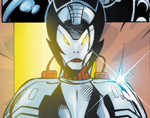

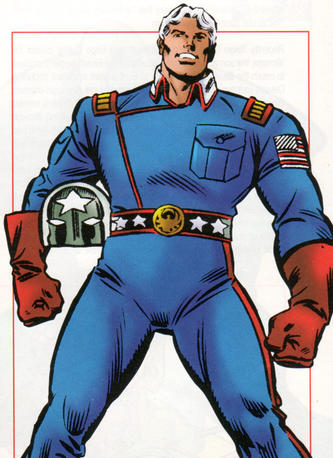

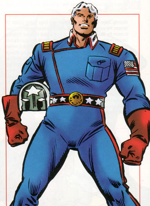

In [17]:
import os

for img in os.listdir('image')[0:50]:
    display(img_resize(Image.open('image/'+img), 150))

#create csv with resized images